https://www.tensorflow.org/datasets/catalog/cats_vs_dogs

In [ ]:
# !pip install -U tensorflow_datasets

In [44]:
import time
import numpy as np
import matplotlib.pylab as plt

import tensorflow as tf
import cv2
import tensorflow_datasets as tfds
tfds.disable_progress_bar()

In [18]:
data_train, ds_info = tfds.load('cats_vs_dogs', split=[tfds.Split.TRAIN], with_info = True)
# with_info=True를 통해서 데이터의 정보도 가져와본다.
ds_info

Dataset cats_vs_dogs downloaded and prepared to ~/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_path='~/tensorflow_datasets/cats_vs_dogs/4.0.0',
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and

In [20]:
images = [ one['image'].numpy() for one in data_train[0].take(30)]
len(images)

30

(-0.5, 499.5, 492.5, -0.5)

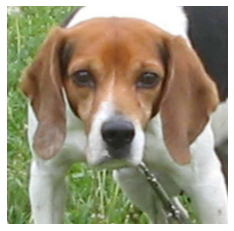

In [24]:
plt.imshow(images[2])
plt.axis('off')

(-0.5, 499.5, 374.5, -0.5)

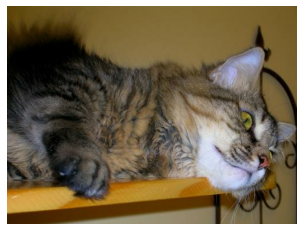

In [25]:
plt.imshow(images[3])
plt.axis('off')

tensorflow에서 제공한 ResNet50 모델을 이용해서 진행한다.

- 케라스를 설치합니다.
- 사전 훈련된 네트워크에 대한 가중치 파일을 다운로드합니다(해당 네트워크 아키텍처를 가져오고 인스턴스화할 때 자동으로 수행됨).
- 사전 훈련된 ImageNet 네트워크를 자신의 이미지에 적용합니다.

In [28]:
resnet50_pre = tf.keras.applications.resnet.ResNet50(weights = 'imagenet', input_shape=(224,224,3))
# imagenet에 학습된 것으로weights를 가져온다
resnet50_pre.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

ResNet50을 통해서 DATASET의 개, 고양이 분류를 해볼 예정이다.

In [29]:
from tensorflow.keras.applications.imagenet_utils import decode_predictions

In [68]:
def pred_img(img):
  plt.imshow(img)
  plt.axis('off')
  plt.show()

  img_resized = cv2.resize(img, (224,224))
  pred = resnet50_pre.predict(img_resized.reshape([1,224,224,3]))
  decoded_pred = decode_predictions(pred)

  for i, instance in enumerate(decoded_pred[0]):
    print('{}위: {} ({:.2f}%)'.format(i+1,instance[1], instance[2]*100))

동물 맞추기

다음 사진에 해당하는 동물은 뭐일까요?


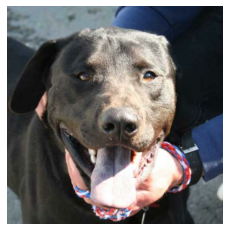

1위: American_Staffordshire_terrier (79.58%)
2위: Weimaraner (8.67%)
3위: Great_Dane (3.24%)
4위: bull_mastiff (2.97%)
5위: Staffordshire_bullterrier (2.26%)

다음 사진에 해당하는 동물은 뭐일까요?


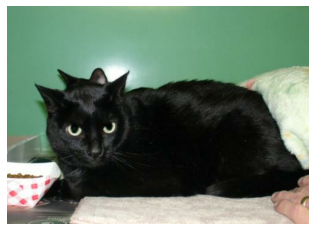

1위: Egyptian_cat (13.10%)
2위: paper_towel (11.39%)
3위: tub (10.80%)
4위: tiger_cat (6.82%)
5위: shower_curtain (3.04%)

다음 사진에 해당하는 동물은 뭐일까요?


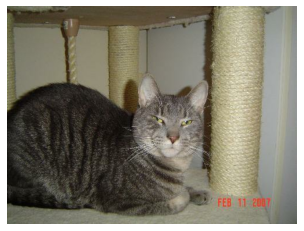

1위: shower_curtain (33.54%)
2위: tiger_cat (20.74%)
3위: tabby (17.58%)
4위: Egyptian_cat (4.44%)
5위: paper_towel (3.47%)

다음 사진에 해당하는 동물은 뭐일까요?


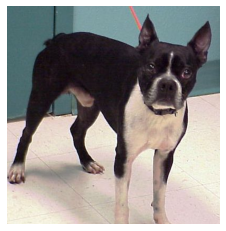

1위: Boston_bull (97.16%)
2위: Chihuahua (1.27%)
3위: French_bulldog (0.49%)
4위: kelpie (0.42%)
5위: miniature_pinscher (0.28%)

다음 사진에 해당하는 동물은 뭐일까요?


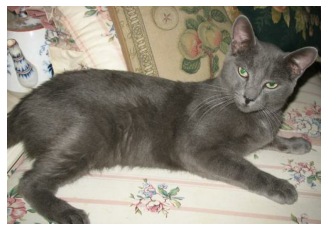

1위: tiger_cat (38.00%)
2위: Egyptian_cat (20.54%)
3위: Siamese_cat (18.59%)
4위: lynx (9.30%)
5위: tabby (4.62%)

다음 사진에 해당하는 동물은 뭐일까요?


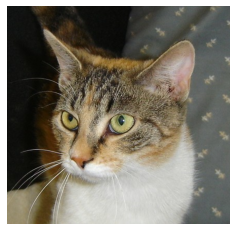

1위: tabby (45.78%)
2위: tiger_cat (30.16%)
3위: Egyptian_cat (9.22%)
4위: lynx (4.09%)
5위: Siamese_cat (3.26%)

다음 사진에 해당하는 동물은 뭐일까요?


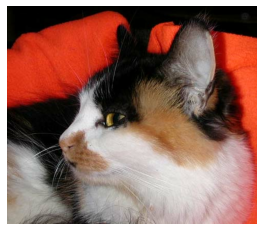

1위: Persian_cat (34.20%)
2위: Siamese_cat (14.96%)
3위: tabby (7.17%)
4위: lynx (6.88%)
5위: tiger_cat (6.49%)

다음 사진에 해당하는 동물은 뭐일까요?


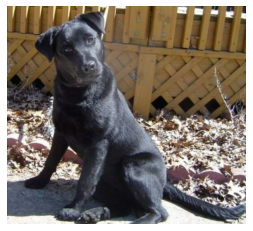

1위: kelpie (54.73%)
2위: Chesapeake_Bay_retriever (37.84%)
3위: Labrador_retriever (1.33%)
4위: miniature_pinscher (1.28%)
5위: schipperke (0.73%)

다음 사진에 해당하는 동물은 뭐일까요?


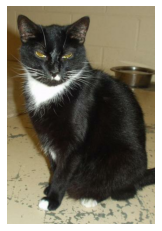

1위: Egyptian_cat (38.22%)
2위: Siamese_cat (35.52%)
3위: tabby (14.97%)
4위: tiger_cat (2.86%)
5위: schipperke (1.02%)

다음 사진에 해당하는 동물은 뭐일까요?


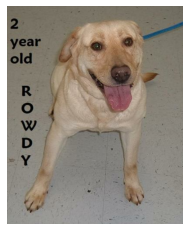

1위: pug (23.54%)
2위: kuvasz (21.13%)
3위: Chihuahua (10.11%)
4위: Labrador_retriever (8.21%)
5위: kelpie (7.79%)


In [69]:
print('동물 맞추기')
for i in range(10,20):
  print('\n다음 사진에 해당하는 동물은 뭐일까요?')
  pred_img(images[i])

# CV2 이용하는 방법 알아보기


In [54]:
from google.colab.patches import cv2_imshow

colab에서는 cv2.imshow가 바로 되지않는다.
그래서 import해줘야한다.

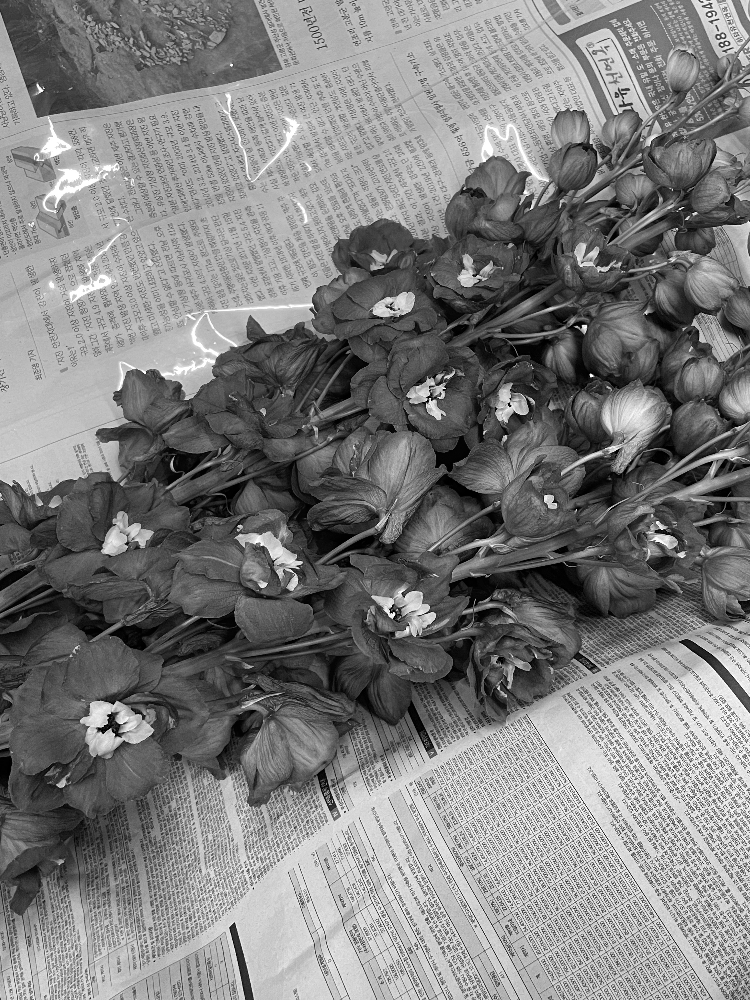

In [61]:
imgfile = '/content/drive/MyDrive/datagit/data/blue_flower.jpg'
img = cv2.imread(imgfile, cv2.IMREAD_GRAYSCALE)
# cv2_imshow(image,0)
cv2_imshow(img)

In [ ]:
# 이미지 저장(저장할 파일명(경로), 저장할 이미지)
# cv.imwrite('/content/drive/MyDrive/datagit/data/flower._gray.jpg', img)